Реализовать синтезирование лиц из LFW с помощью DCGAN


In [1]:
%tensorflow_version 2.x

In [2]:
import random

import numpy as np
import matplotlib.pyplot as plt

import tensorflow_datasets as tfds
import tensorflow as tf
from tensorflow.keras import layers

In [3]:
(train_ds, test_ds), ds_info = tfds.load(
    name='lfw',
    as_supervised=True, with_info=True, 
    split=['train[:99%]', 'train[99%:]']
)

Shuffling and writing examples to /root/tensorflow_datasets/lfw/0.1.0.incompleteV3C1IA/lfw-train.tfrecord


Dataset lfw downloaded and prepared to /root/tensorflow_datasets/lfw/0.1.0. Subsequent calls will reuse this data.


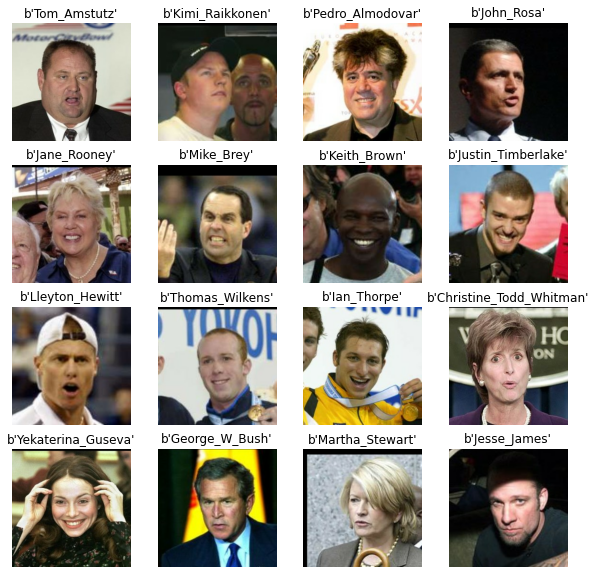

In [4]:
plt.figure(figsize=(10, 10))
for i, x in enumerate(train_ds.take(16)):
    plt.subplot(4, 4, i+1)
    plt.title(x[0].numpy())
    plt.imshow(x[1])
    plt.axis('off')

In [5]:
ex_lbl, ex_img = next(iter(train_ds.take(1)))
np.min(ex_img), np.max(ex_img), ex_img.shape

(0, 255, TensorShape([250, 250, 3]))

In [6]:
BATCH_SIZE = 64
HALF_BATCH_SIZE = BATCH_SIZE // 2
EPOCHS = 50
IM_SIZE = 56

def prep_imgs(lbl, img):
    img = tf.cast(img, tf.float32) / 255
    img = tf.image.resize(img, (IM_SIZE, IM_SIZE))
    return lbl, img

train_ds = train_ds.map(prep_imgs)
train_ds = train_ds.repeat(EPOCHS)
train_ds = train_ds.batch(HALF_BATCH_SIZE, drop_remainder=True)

train_ds

<BatchDataset shapes: ((32,), (32, 56, 56, 3)), types: (tf.string, tf.float32)>

In [7]:
class Generator(tf.keras.Model):
    def __init__(self):
        super().__init__()
        self.dns = layers.Dense(128*7*7, activation='relu')
        self.resh = layers.Reshape((7, 7, 128))
        self.ups = layers.UpSampling2D((2, 2))
        
        self.conv1 = layers.Conv2D(128, (3, 3), padding='same')
        self.conv2 = layers.Conv2D(64, (3, 3), padding='same')
        self.conv3 = layers.Conv2D(32, (3, 3), padding='same')
        
        self.conv0 = layers.Conv2D(3, (3, 3), padding='same', activation='sigmoid')
        
        self.bnorm1 = layers.BatchNormalization(momentum=0.8)
        self.bnorm2 = layers.BatchNormalization(momentum=0.8)
        self.bnorm3 = layers.BatchNormalization(momentum=0.8)
        
        self.relu = layers.ReLU()
        
    def call(self, inp):
        out = self.dns(inp)
        out = self.resh(out)
        
        out = self.ups(out)
        out = self.conv1(out)
        out = self.bnorm1(out)
        out = self.relu(out)
        
        out = self.ups(out)
        out = self.conv2(out)
        out = self.bnorm2(out)
        out = self.relu(out)
        
        out = self.ups(out)
        out = self.conv3(out)
        out = self.bnorm3(out)
        out = self.relu(out)
        
        out = self.conv0(out)
        
        return out

In [8]:
class Discriminator(tf.keras.Model):
    def __init__(self):
        super().__init__()
        self.conv1 = layers.Conv2D(32, (3, 3), strides=(2, 2), padding='same')
        self.conv2 = layers.Conv2D(64, (3, 3), strides=(2, 2), padding='same')
        self.conv3 = layers.Conv2D(128, (3, 3), strides=(2, 2), padding='same')
        self.conv4 = layers.Conv2D(256, (3, 3), strides=(1, 1), padding='same')
        
        self.bnorm1 = layers.BatchNormalization(momentum=0.8)
        self.bnorm2 = layers.BatchNormalization(momentum=0.8)
        self.bnorm3 = layers.BatchNormalization(momentum=0.8)
        
        self.lrelu = layers.LeakyReLU(0.2)
        self.dout = layers.Dropout(0.25)
        self.zpadd = layers.ZeroPadding2D(padding=((0, 1), (0, 1)))
        self.fltn = layers.Flatten()
        self.dns = layers.Dense(1)
        
    def call(self, inp):
        out = self.conv1(inp)
        out = self.lrelu(out)
        out = self.dout(out)
        
        out = self.conv2(out)
        out = self.zpadd(out)
        out = self.bnorm1(out)
        out = self.lrelu(out)
        out = self.dout(out)
        
        out = self.conv3(out)
        out = self.bnorm2(out)
        out = self.lrelu(out)
        out = self.dout(out)
        
        out = self.conv4(out)
        out = self.bnorm3(out)
        out = self.lrelu(out)
        out = self.dout(out)
        
        out = self.fltn(out)
        out = self.dns(out)
        
        return out

In [9]:
LEARNING_RATE = 0.00002
INPUT_DIM = 100

generator = Generator()
discriminator = Discriminator()

optimizer = tf.keras.optimizers.Adam(LEARNING_RATE)
sigmoid_cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [10]:
checkpoint_path = "./checkpoints2/train"

ckpt = tf.train.Checkpoint(
    generator=generator,
    discriminator=discriminator
)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    print ('Latest checkpoint restored!')

[Step 0] D Loss: 0.7745; G Loss: 0.7045


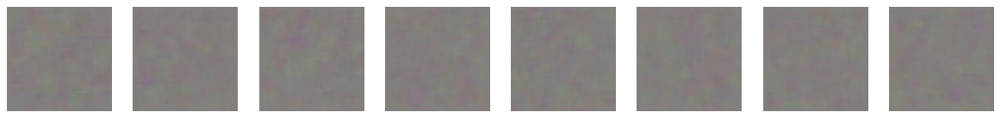

[Step 100] D Loss: 0.5299; G Loss: 1.8691


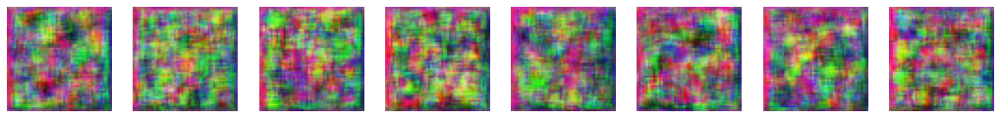

[Step 200] D Loss: 0.4387; G Loss: 3.3500


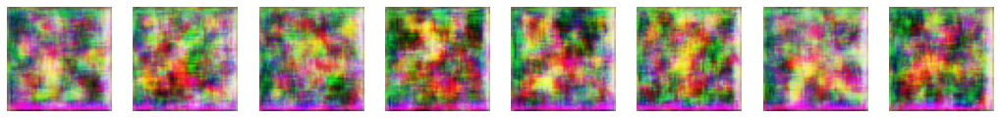

[Step 300] D Loss: 0.5523; G Loss: 1.9254


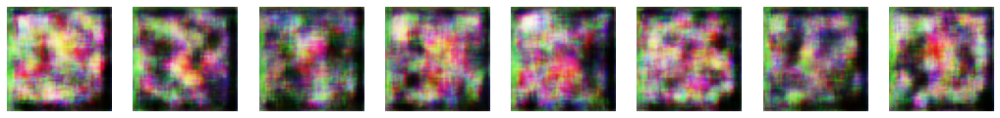

[Step 400] D Loss: 0.6945; G Loss: 2.3969


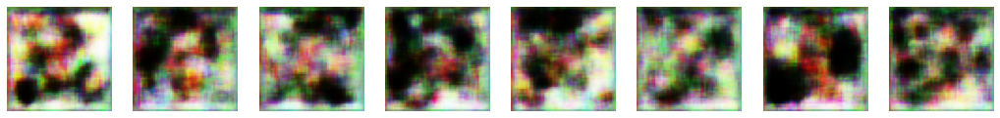

[Step 500] D Loss: 0.6361; G Loss: 1.0498


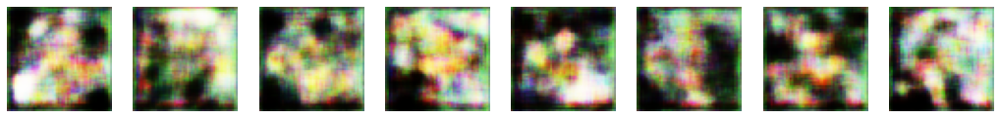

[Step 600] D Loss: 0.4724; G Loss: 1.6405


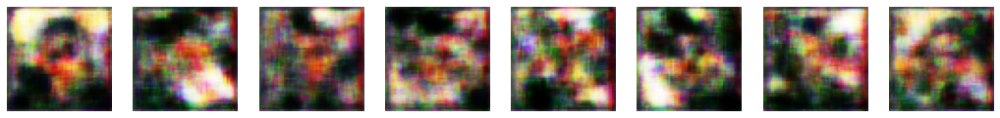

[Step 700] D Loss: 0.7553; G Loss: 1.5580


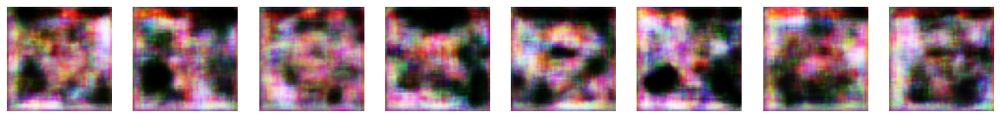

[Step 800] D Loss: 0.5844; G Loss: 0.9823


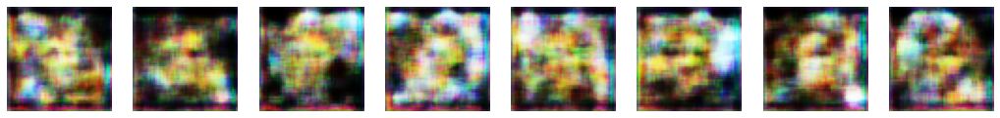

[Step 900] D Loss: 0.4859; G Loss: 1.4500


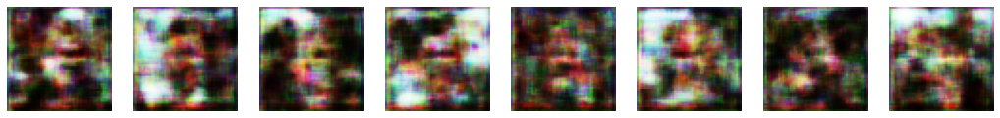

[Step 1000] D Loss: 0.8623; G Loss: 1.3739


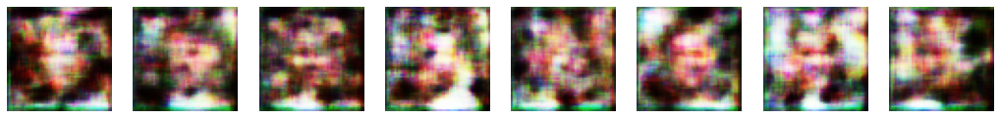

[Step 1100] D Loss: 0.6174; G Loss: 0.9439


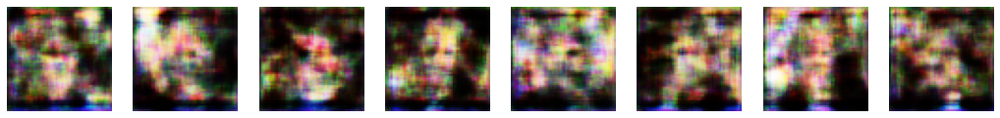

[Step 1200] D Loss: 0.9133; G Loss: 1.4742


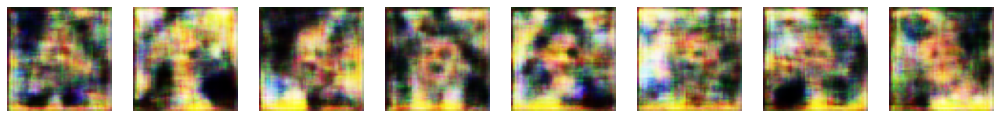

[Step 1300] D Loss: 0.7001; G Loss: 0.8469


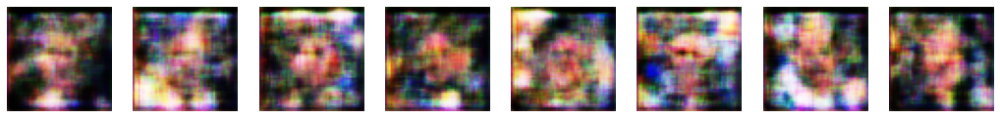

[Step 1400] D Loss: 0.5994; G Loss: 1.5980


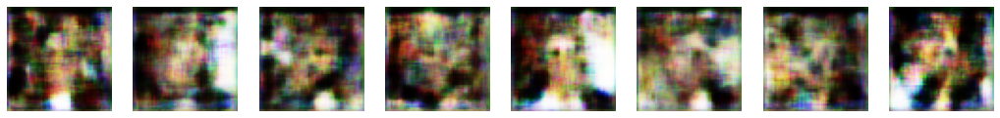

[Step 1500] D Loss: 0.6194; G Loss: 1.4597


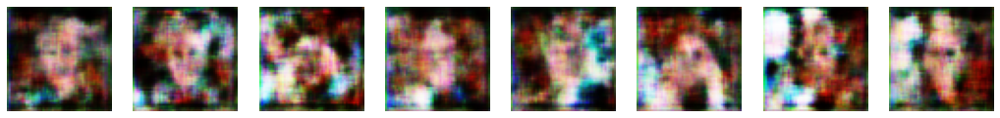

[Step 1600] D Loss: 0.7497; G Loss: 1.2615


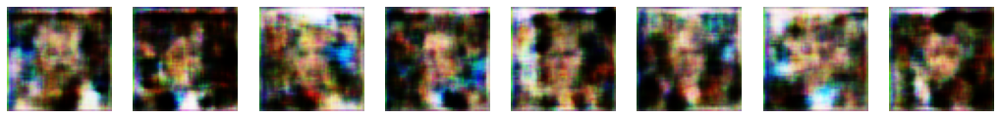

[Step 1700] D Loss: 0.4691; G Loss: 1.3213


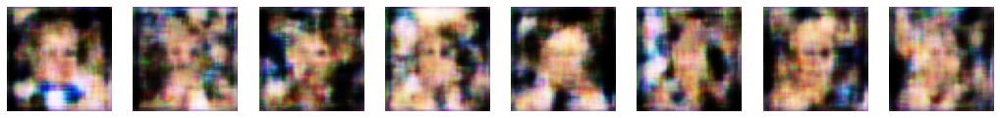

[Step 1800] D Loss: 0.6855; G Loss: 1.1828


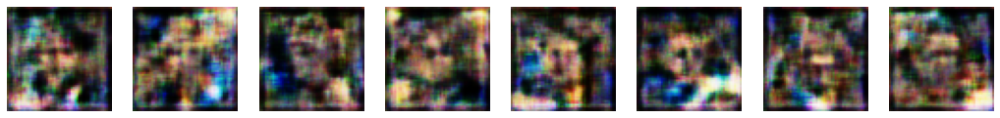

[Step 1900] D Loss: 0.9816; G Loss: 1.5983


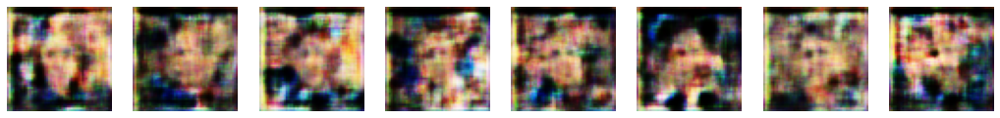

[Step 2000] D Loss: 0.8959; G Loss: 1.3080


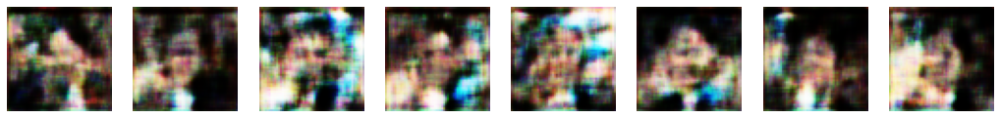

[Step 2100] D Loss: 0.5682; G Loss: 1.8033


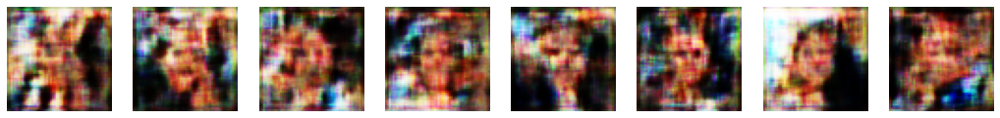

[Step 2200] D Loss: 0.5700; G Loss: 1.7544


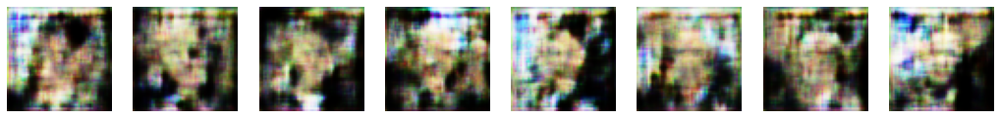

[Step 2300] D Loss: 0.5990; G Loss: 1.2092


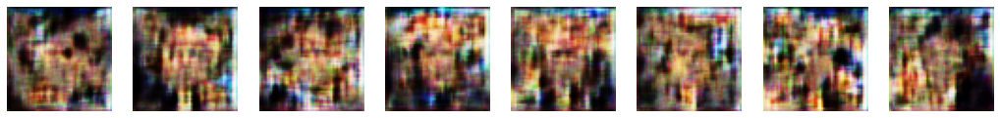

[Step 2400] D Loss: 0.8193; G Loss: 1.0359


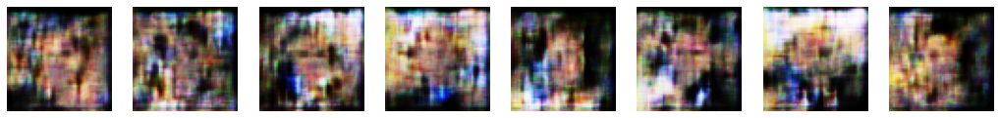

[Step 2500] D Loss: 0.7340; G Loss: 0.8958


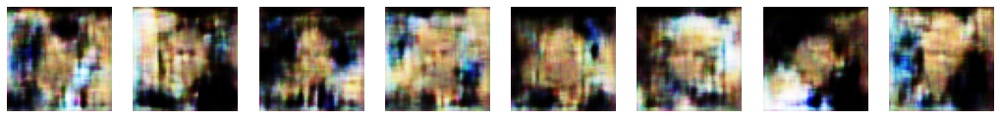

[Step 2600] D Loss: 0.4454; G Loss: 1.3849


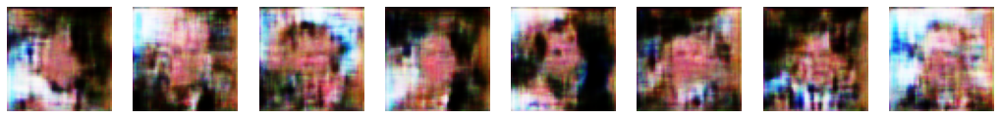

[Step 2700] D Loss: 0.6761; G Loss: 1.4963


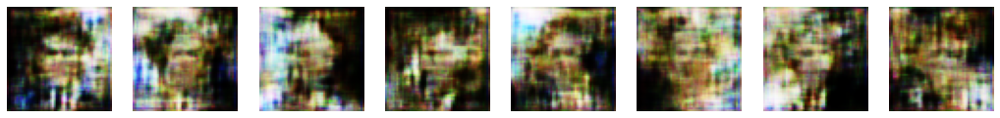

[Step 2800] D Loss: 0.4925; G Loss: 1.7125


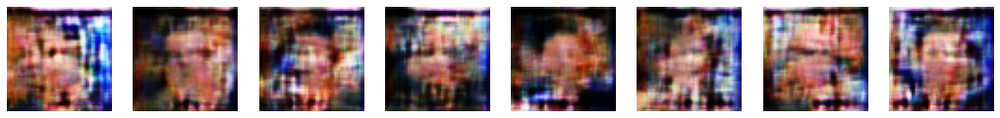

[Step 2900] D Loss: 0.5580; G Loss: 2.3605


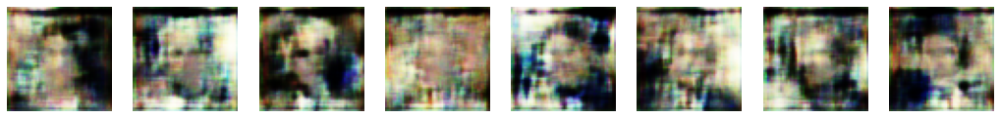

[Step 3000] D Loss: 0.4377; G Loss: 2.6248


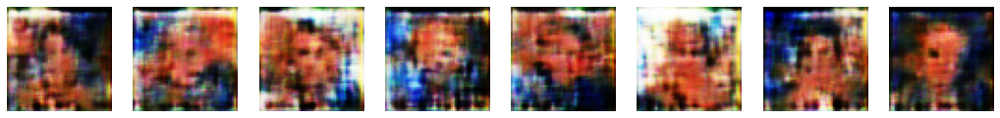

[Step 3100] D Loss: 0.4742; G Loss: 2.2971


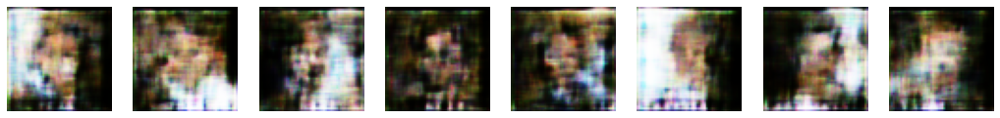

[Step 3200] D Loss: 0.7383; G Loss: 2.3748


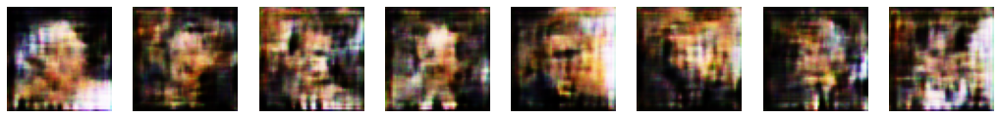

[Step 3300] D Loss: 0.4827; G Loss: 1.5496


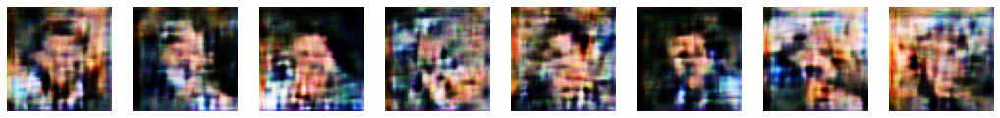

[Step 3400] D Loss: 0.6184; G Loss: 1.5699


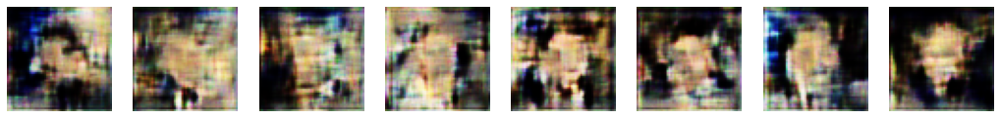

[Step 3500] D Loss: 0.6641; G Loss: 1.8218


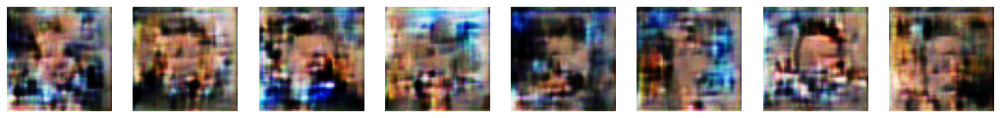

[Step 3600] D Loss: 0.5706; G Loss: 2.5636


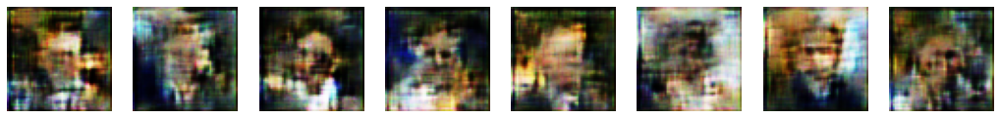

[Step 3700] D Loss: 0.5007; G Loss: 2.8601


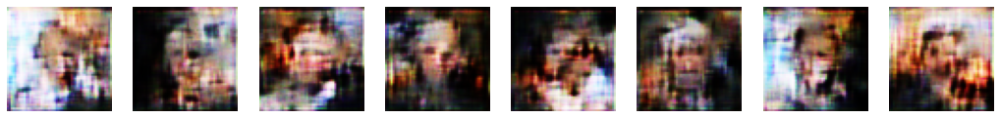

[Step 3800] D Loss: 0.5369; G Loss: 2.4733


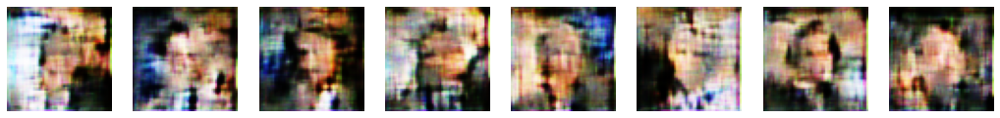

[Step 3900] D Loss: 0.7346; G Loss: 1.9980


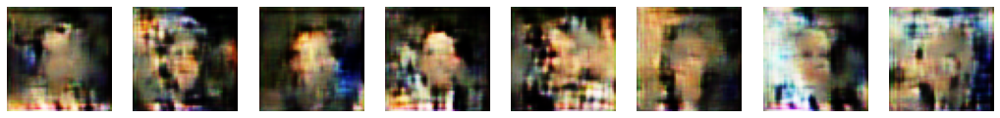

[Step 4000] D Loss: 0.6442; G Loss: 2.6909


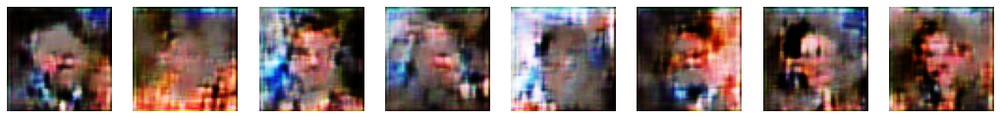

[Step 4100] D Loss: 0.6657; G Loss: 2.5135


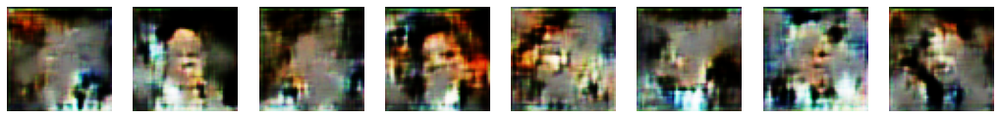

[Step 4200] D Loss: 0.6048; G Loss: 2.4867


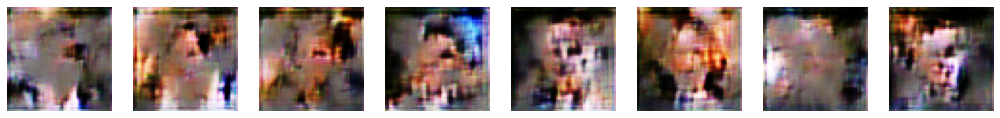

[Step 4300] D Loss: 0.6196; G Loss: 2.9413


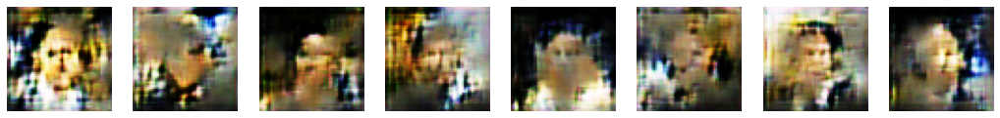

[Step 4400] D Loss: 0.5232; G Loss: 2.7608


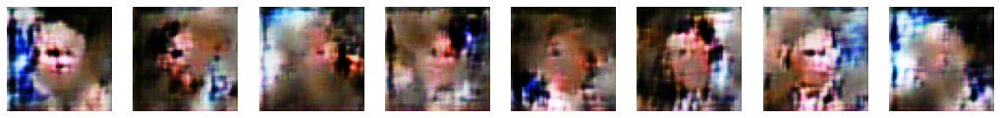

[Step 4500] D Loss: 0.4232; G Loss: 3.2962


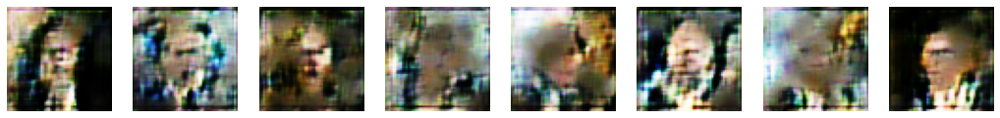

[Step 4600] D Loss: 0.5968; G Loss: 2.6740


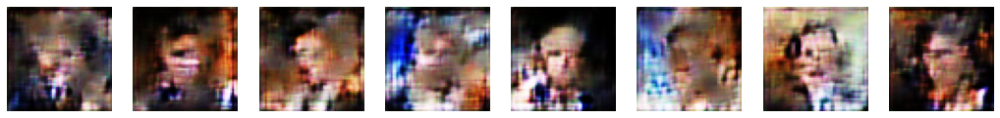

[Step 4700] D Loss: 0.5713; G Loss: 2.5062


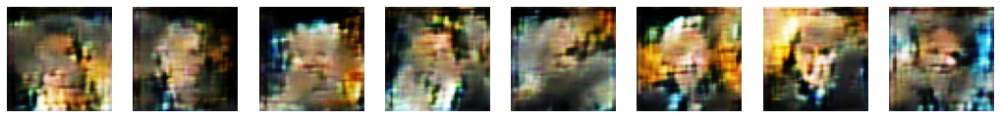

[Step 4800] D Loss: 0.5177; G Loss: 2.7169


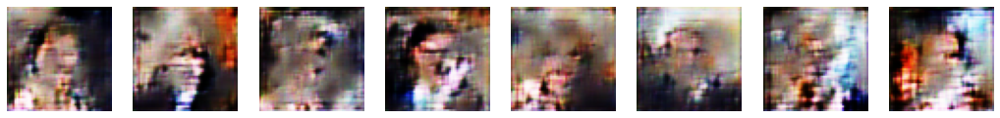

[Step 4900] D Loss: 0.6089; G Loss: 2.4734


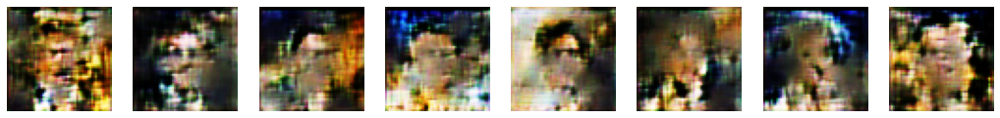

[Step 5000] D Loss: 0.6386; G Loss: 2.3408


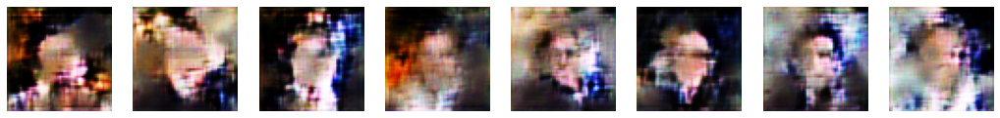

[Step 5100] D Loss: 0.6150; G Loss: 3.3358


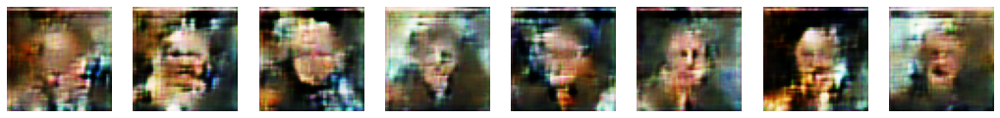

[Step 5200] D Loss: 0.5791; G Loss: 2.6318


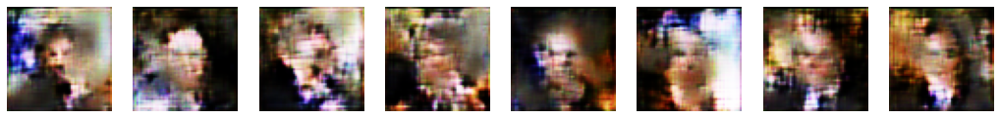

[Step 5300] D Loss: 0.5503; G Loss: 2.4995


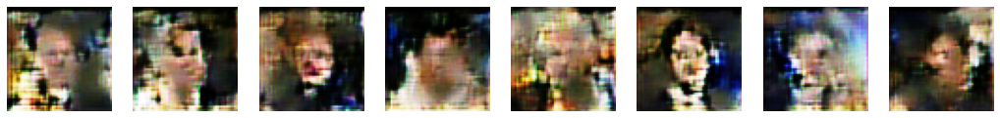

[Step 5400] D Loss: 0.6397; G Loss: 2.0244


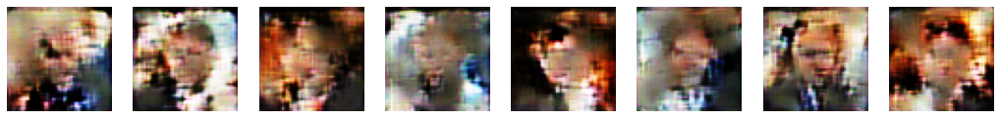

[Step 5500] D Loss: 0.6577; G Loss: 2.3550


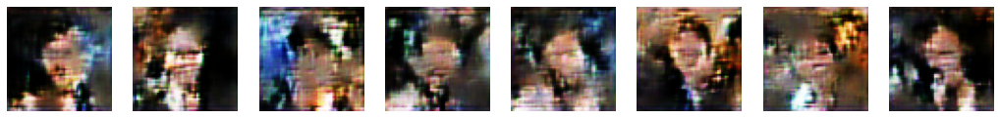

[Step 5600] D Loss: 0.5487; G Loss: 1.9690


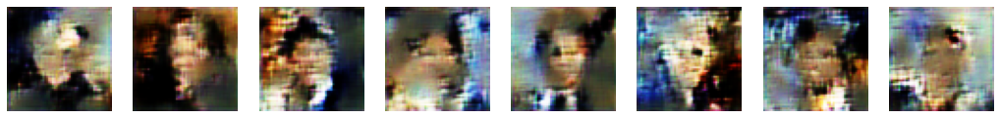

[Step 5700] D Loss: 0.6403; G Loss: 2.6082


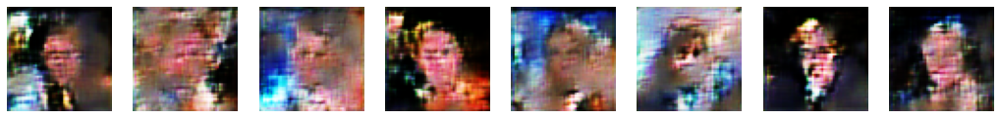

[Step 5800] D Loss: 0.6214; G Loss: 2.8802


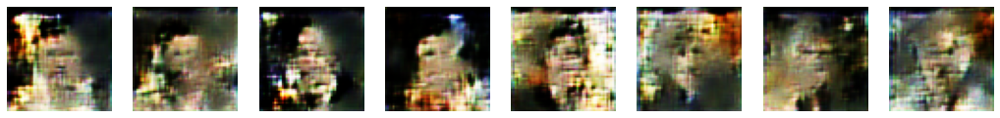

[Step 5900] D Loss: 0.5910; G Loss: 2.6063


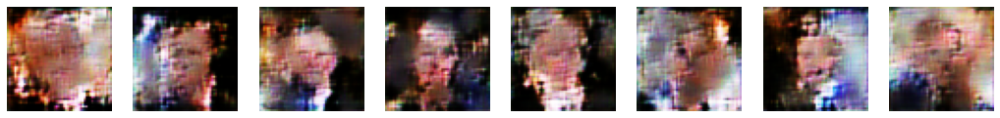

[Step 6000] D Loss: 0.4407; G Loss: 2.9902


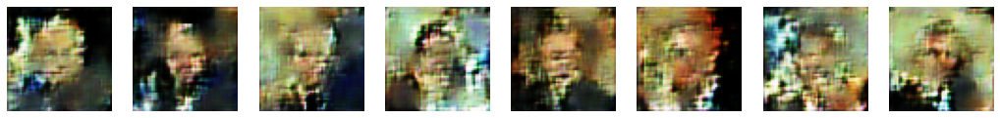

[Step 6100] D Loss: 0.4219; G Loss: 2.4556


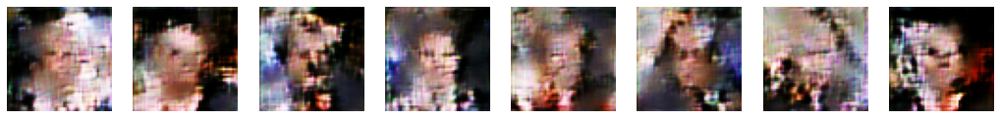

[Step 6200] D Loss: 0.5344; G Loss: 2.4586


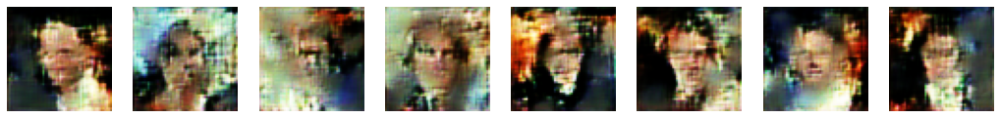

[Step 6300] D Loss: 0.4526; G Loss: 2.6430


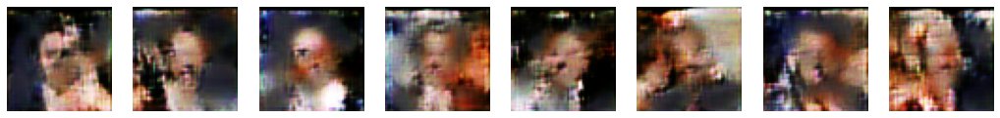

[Step 6400] D Loss: 0.6371; G Loss: 2.4342


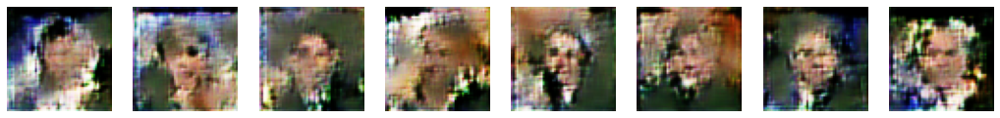

[Step 6500] D Loss: 0.5487; G Loss: 2.0421


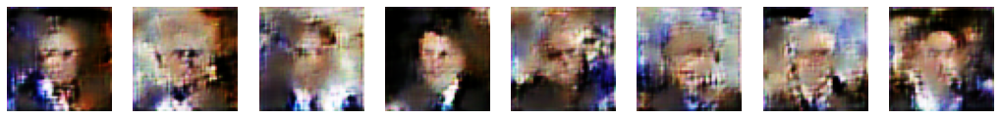

[Step 6600] D Loss: 0.4844; G Loss: 2.8528


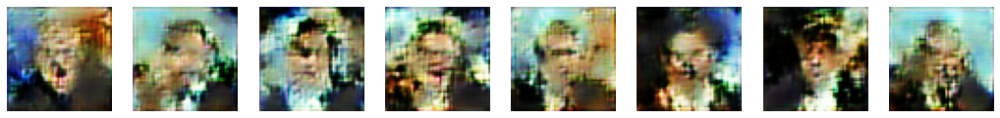

[Step 6700] D Loss: 0.6204; G Loss: 1.8491


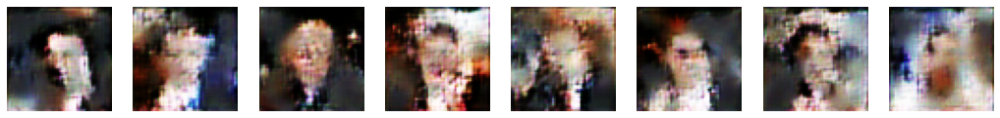

[Step 6800] D Loss: 0.8219; G Loss: 2.1280


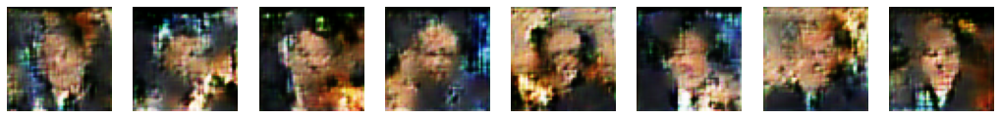

[Step 6900] D Loss: 0.5706; G Loss: 2.0274


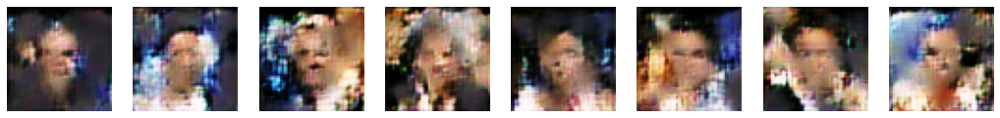

[Step 7000] D Loss: 0.5550; G Loss: 2.7701


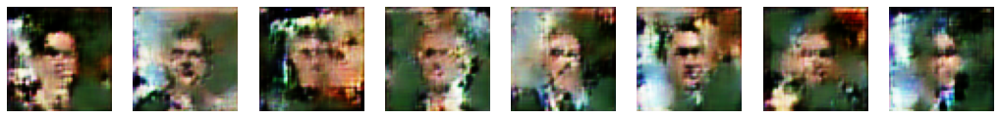

[Step 7100] D Loss: 0.5500; G Loss: 2.4294


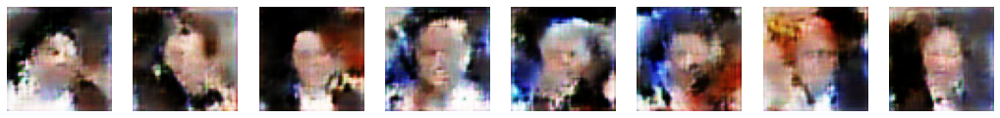

[Step 7200] D Loss: 0.7491; G Loss: 2.4529


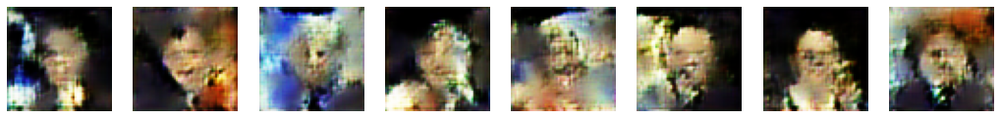

[Step 7300] D Loss: 0.6417; G Loss: 2.0488


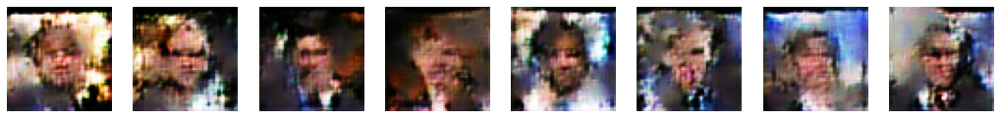

In [ ]:
%%time

d_loss = []
g_loss = []

for step, (_, true_imgs) in enumerate(train_ds):

    # Train Discriminator

    noise = np.random.normal(0, 1, (HALF_BATCH_SIZE, INPUT_DIM)).astype(np.float32)
    gen_imgs = generator.predict(noise)

    x_comb = np.concatenate((
        true_imgs, 
        gen_imgs))
    y_comb = np.concatenate((
        np.ones((HALF_BATCH_SIZE, 1), np.float32), 
        np.zeros((HALF_BATCH_SIZE, 1), np.float32)))

    with tf.GradientTape() as tape:
        logs = discriminator(x_comb, training=True)
        d_loss_value = sigmoid_cross_entropy(y_comb, logs)
    grads = tape.gradient(d_loss_value, discriminator.trainable_variables)
    optimizer.apply_gradients(zip(grads, discriminator.trainable_variables))
    
    d_loss.append(d_loss_value)
    
    # Train Generator

    noise = np.random.normal(0, 1, (BATCH_SIZE, INPUT_DIM)).astype(np.float32)
    y_mislabled = np.ones((BATCH_SIZE, 1), np.float32)

    with tf.GradientTape() as tape:
        gen_imgs = generator(noise, training=True)
        logs = discriminator(gen_imgs, training=False)
        g_loss_value = sigmoid_cross_entropy(y_mislabled, logs)

    grads = tape.gradient(g_loss_value, generator.trainable_variables)
    optimizer.apply_gradients(zip(grads, generator.trainable_variables))
    
    g_loss.append(g_loss_value)

    if step % 100 == 0:
        d_loss.append(d_loss_value)
        g_loss.append(g_loss_value)
        
        print(f'[Step {step}] D Loss: {d_loss_value.numpy():.4f}; G Loss: {g_loss_value.numpy():.4f}')
        noise = np.random.normal(0, 1, (8, INPUT_DIM)).astype(np.float32)
        gen_imgs = generator.predict(noise)
        plt.figure(figsize=(18, 2))
        for i in range(gen_imgs.shape[0]):
            plt.subplot(1, 8, i+1)
            plt.imshow(gen_imgs[i])
            plt.axis('off')
        plt.show()
        
        ckpt_manager.save()

Видно, что модель пытается строить, какие-то очертания лиц присутствуют, но качество все равно очень низкое пока...